In [1]:
import numpy as np
from matplotlib import pyplot as plt

from astropy.io import fits
from astropy.modeling import models, fitting
from photutils.aperture import CircularAperture, EllipticalAperture
from photutils.aperture import aperture_photometry

%matplotlib inline
#%config InlineBackend.figure_format='retina'
#!pip install git+https://github.com/M-Bianchi/My_matplotlib_style
plt.style.use('mystyle')
plt.rcParams['axes.grid'] = False

In [2]:
# Function to open the fits file and plot them
def Open_Fits(filepath, plot, cmap='gnuplot2'):
    file_temp = fits.open(filepath)
    file = file_temp[0].data
    file_temp.close()
    if plot == True:
        plt.imshow(file, clim=(0, np.quantile(file, [0.99])), cmap=cmap, origin='lower')
        plt.colorbar(fraction=0.0375, pad=0.02);
    return file

# Error estimation

In [3]:
# Function to manually select a sensible threshold for masking astrophysical sources in the image
def Select_Threshold(image, threshold):
    # We set the sources to zero in order to identify the mask in the image 
    image_masked = image.copy()
    image_masked[image > threshold] = 0
    
    # Plot the results
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))
    ax = axes[0]
    ax.hist(image.flatten(), bins=np.linspace(np.quantile(image, [0.005])[0], np.quantile(image, [0.995])[0], 100), histtype='step');
    ax.axvline(threshold, color='k', linestyle='--', label=f'threshold = {threshold:.3f}')
    ax.legend()
    
    ax = axes[1]
    img = ax.imshow(image_masked, clim=(0, np.quantile(image_masked, [0.99])), cmap='gnuplot2', origin='lower')
    cax = fig.add_axes([0.905, 0.132, 0.015, 0.725])
    fig.colorbar(img, cax=cax);
    
    return fig, axes

In [4]:
# Function to cover the nebula with a circular mask
def Create_Circular_Mask(image, center, radius, mask=None, cmap='gnuplot2'):
    Y, X = np.ogrid[:image.shape[0], :image.shape[1]]
    dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)

    mask_circ = dist_from_center <= radius
    
    # Plot the results
    circle = plt.Circle(center, radius, color='black', fill=False)

    fig, axes = plt.subplots(1, 2, figsize=(21, 7))
    ax = axes[0]
    img = ax.imshow(image, clim=np.quantile(image, [0.01, 0.99]), cmap=cmap, origin='lower')
    cax = fig.add_axes([0.465, 0.11, 0.015, 0.77])
    fig.colorbar(img, cax=cax)
    ax.add_patch(circle)

    ax = axes[1]
    if mask is None: mask_tot = mask_circ
    else: mask_tot = np.logical_or(mask, mask_circ)
    img = ax.imshow(np.where(mask_tot, 0, image), clim=(0, np.quantile(np.where(mask_tot, 0, image), [0.99])), cmap=cmap, origin='lower')
    cax = fig.add_axes([0.887, 0.11, 0.015, 0.77])
    fig.colorbar(img, cax=cax);
    
    return mask_circ

## Ha

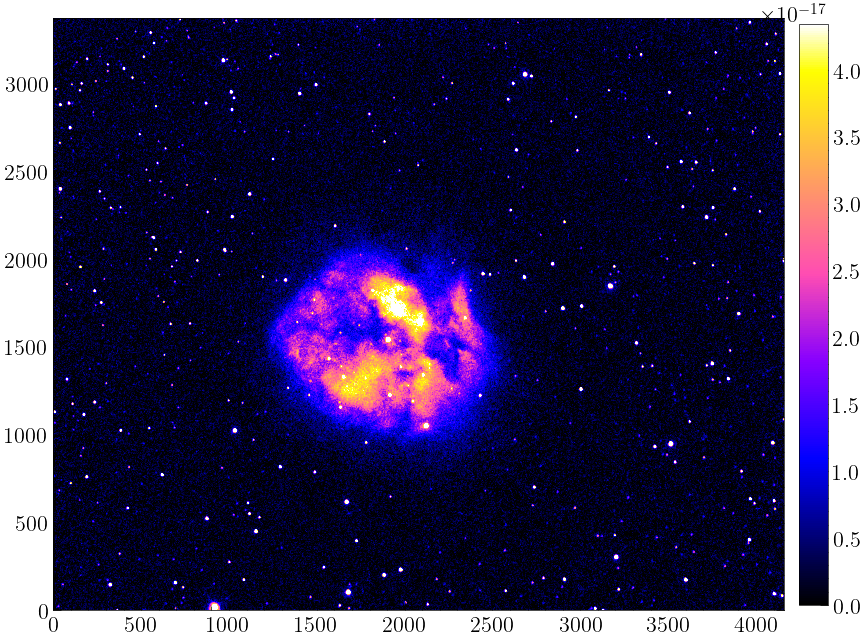

In [5]:
final_Ha_physical = Open_Fits(filepath='Data/final_Ha_physical.fits', plot=True)

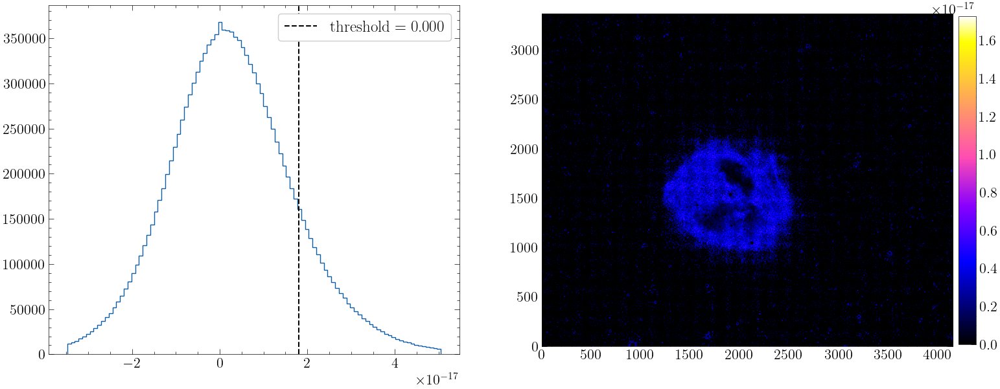

In [6]:
threshold = 1.8e-17
fig, axes = Select_Threshold(final_Ha_physical, threshold)

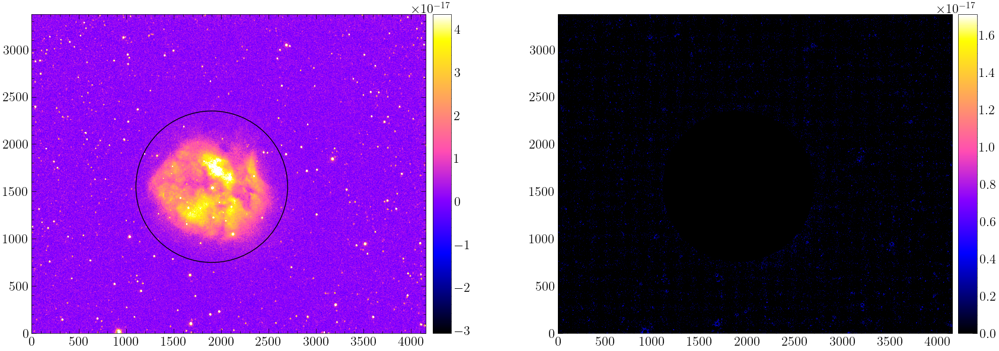

In [7]:
mask_circ = Create_Circular_Mask(final_Ha_physical, center=(1900, 1550), radius=800, mask=final_Ha_physical>threshold)

In [8]:
mask_tot = np.logical_or(final_Ha_physical > threshold, mask_circ)
final_Ha_physical_std = np.std(final_Ha_physical[~mask_tot])
final_Ha_physical_std

1.1192824445965711e-17

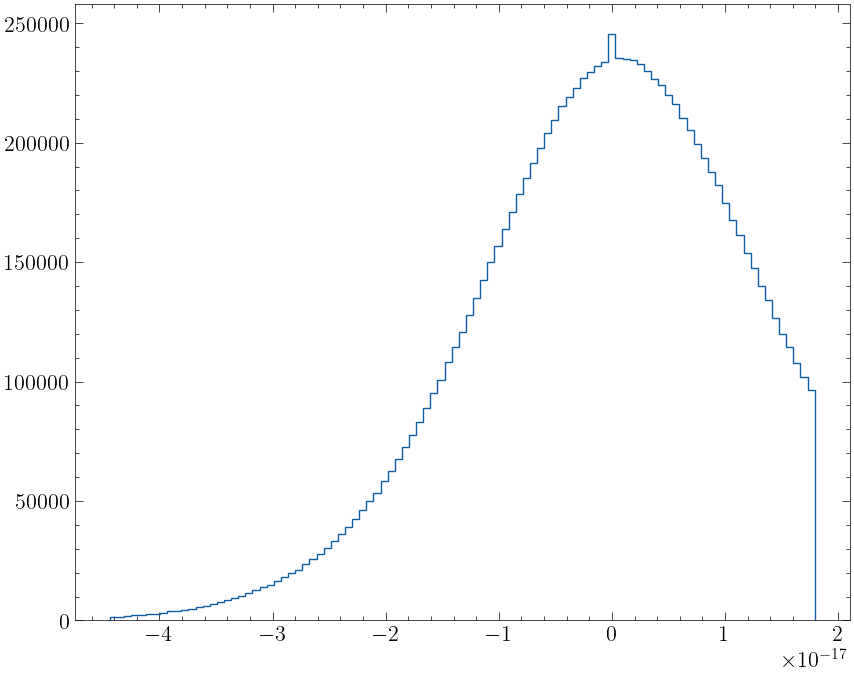

In [9]:
plt.hist(final_Ha_physical[~mask_tot].flatten(), bins=np.linspace(np.quantile(final_Ha_physical[~mask_tot], [0.001])[0], np.quantile(final_Ha_physical[~mask_tot], [0.999])[0], 100), histtype='step');

In [10]:
np.sum(final_Ha_physical[~mask_tot]==0)

10377

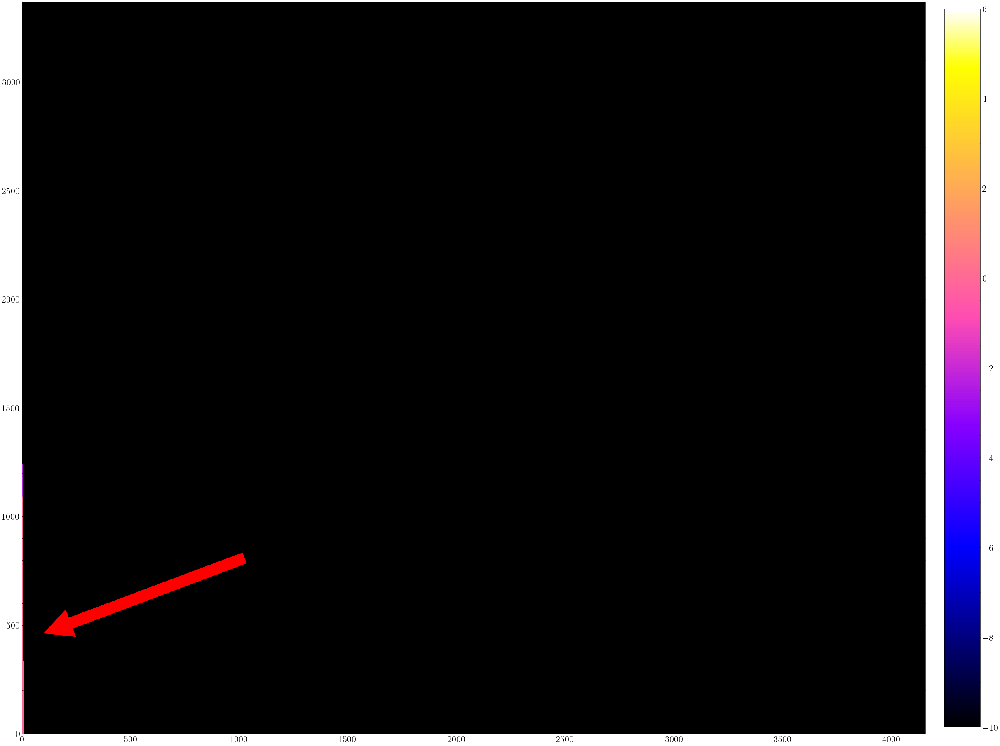

In [11]:
prova = final_Ha_physical.copy()
prova[prova != 0] = -100
plt.figure(figsize=(30, 30))
plt.imshow(prova, clim=(-10, 6), cmap='gnuplot2', origin='lower')
plt.colorbar(fraction=0.0375, pad=0.02)
plt.arrow(1000, 800, -800, -300, lw=20, head_width=50, head_length=50, fc='red', ec='red');

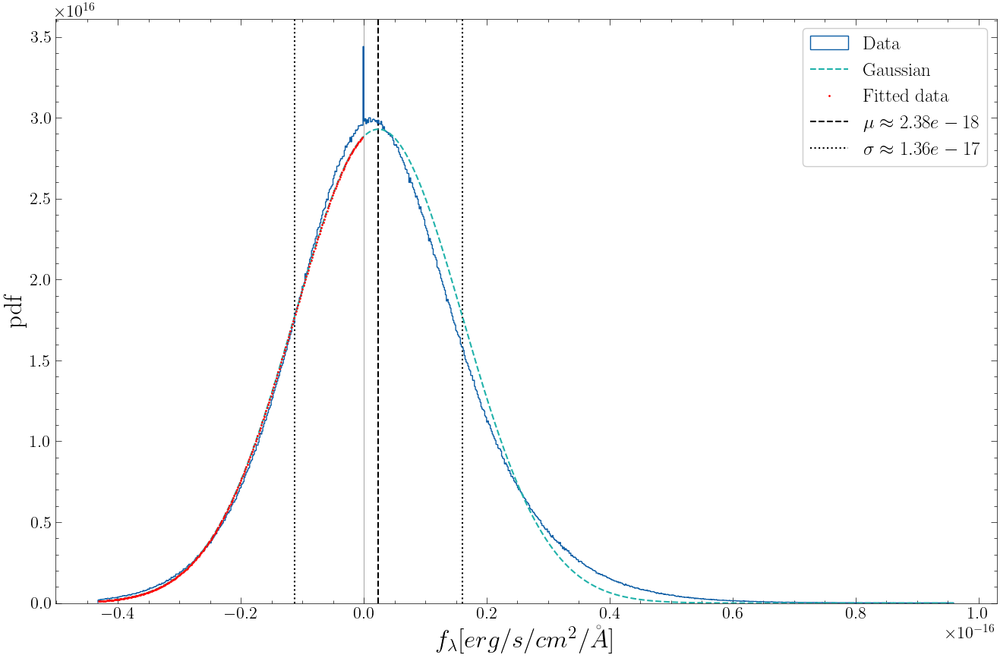

In [12]:
from scipy.optimize import curve_fit
from scipy import stats

# Create an histogram, with a number of bins given by the Friedmann-Diaconis rule (https://en.wikipedia.org/wiki/Freedman%E2%80%93Diaconis_rule), and fit it with a Gaussian.
bins = np.histogram_bin_edges(final_Ha_physical.flatten(), bins='fd', range=[np.quantile(final_Ha_physical, [0.001])[0], np.quantile(final_Ha_physical, [0.999])[0]])
x_hist = bins[:-1] + np.diff(bins)/2

# We have to rescale the data, overwise the fit would fail.
y_fit, bins_fit = np.histogram(1e17*final_Ha_physical, density=True, bins=1e17*bins)
x_fit = bins_fit[:-1] + np.diff(bins_fit)/2

half_index = int(np.median(np.where(np.isclose(x_fit, 0, atol=1e-1))[0]))
fit_result = curve_fit(stats.norm.pdf, x_fit[:half_index], y_fit[:half_index], [0, 1], sigma=np.sqrt(y_fit[:half_index]))
mu = 1e-17*fit_result[0][0]
sigma= 1e-17*fit_result[0][1]


# Plot the results
plt.figure(figsize=(16, 10))
plt.hist(final_Ha_physical.flatten(), bins=bins, histtype='step', density=True, label='Data');
plt.plot(x_hist, stats.norm.pdf(x_hist, loc=mu, scale=sigma), linestyle='--', c='lightseagreen', label='Gaussian')
plt.plot(x_hist[:half_index], stats.norm.pdf(x_hist[:half_index], loc=mu, scale=sigma), marker='.', markersize=2, markeredgecolor='red', markerfacecolor='red', linewidth=0, label='Fitted data')
plt.axvline(mu, c='k', lw=1.5, linestyle='--', label=f'$\mu \\approx {mu:.2e}$', zorder=0)
plt.axvline(mu-sigma, c='k', lw=1.5, linestyle=':', label=f'$\sigma \\approx {sigma:.2e}$', zorder=0)
plt.axvline(mu+sigma, c='k', lw=1.5, linestyle=':', zorder=0)
plt.axvline(0, c='gray', lw=0.5, zorder=0)
plt.xlabel('$f_\lambda [erg/s/cm^2/\AA]$')
plt.ylabel('pdf')
plt.legend();

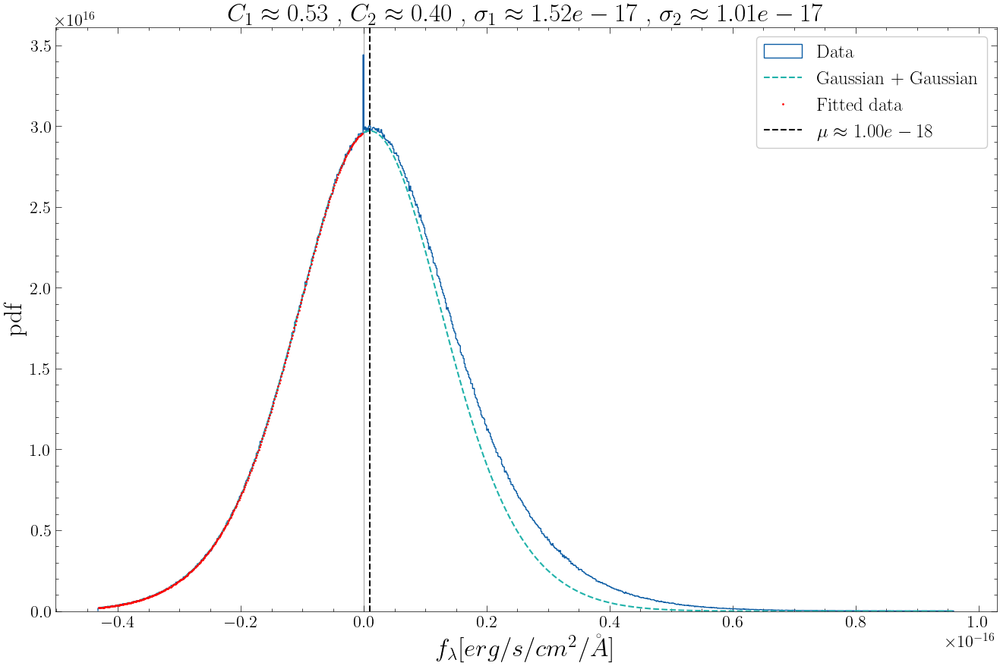

In [13]:
def Gauss_Plus_Gauss(x, mu, C_gauss1, scale_gauss1, C_gauss2, scale_gauss2):
    return (C_gauss1*stats.norm.pdf(x, loc=mu, scale=scale_gauss1) + C_gauss2*stats.norm.pdf(x, loc=mu, scale=scale_gauss2))

# Create an histogram, with a number of bins given by the Friedmann-Diaconis rule (https://en.wikipedia.org/wiki/Freedman%E2%80%93Diaconis_rule), and fit it with a Gaussian.
bins = np.histogram_bin_edges(final_Ha_physical.flatten(), bins='fd', range=[np.quantile(final_Ha_physical, [0.001])[0], np.quantile(final_Ha_physical, [0.999])[0]])
x_hist = bins[:-1] + np.diff(bins)/2

# We have to rescale the data, overwise the fit would fail.
y_fit, bins_fit = np.histogram(1e17*final_Ha_physical, density=True, bins=1e17*bins)
x_fit = bins_fit[:-1] + np.diff(bins_fit)/2

half_index = int(np.median(np.where(np.isclose(x_fit, 0, atol=1e-1))[0]))
fit_result = curve_fit(Gauss_Plus_Gauss, x_fit[:half_index], y_fit[:half_index], [0, 0.5, 1, 0.5, 1], sigma=np.sqrt(y_fit[:half_index]), bounds=([-0.1, 0, 0, 0, 0], [0.1, 1, 5, 1, 5]))
mu = 1e-17*fit_result[0][0]
C_gauss1 = fit_result[0][1]
scale_gauss1 = 1e-17*fit_result[0][2]
C_gauss2 = fit_result[0][3]
scale_gauss2 = 1e-17*fit_result[0][4]


# Plot the results
plt.figure(figsize=(16, 10))
plt.title(f'$C_1 \\approx {C_gauss1:.2f}$ , $C_2 \\approx {C_gauss2:.2f}$ , $\sigma_1 \\approx {scale_gauss1:.2e}$ , $\sigma_2 \\approx {scale_gauss2:.2e}$')
plt.hist(final_Ha_physical.flatten(), bins=bins, histtype='step', density=True, label='Data');
plt.plot(x_hist, Gauss_Plus_Gauss(x_hist, mu, C_gauss1, scale_gauss1, C_gauss2, scale_gauss2), linestyle='--', c='lightseagreen', label='Gaussian + Gaussian')
plt.plot(x_hist[:half_index], Gauss_Plus_Gauss(x_hist[:half_index], mu, C_gauss1, scale_gauss1, C_gauss2, scale_gauss2), marker='.', markersize=2, markeredgecolor='red', markerfacecolor='red', linewidth=0, label='Fitted data')
plt.axvline(mu, c='k', lw=1.5, linestyle='--', label=f'$\mu \\approx {mu:.2e}$', zorder=0)
plt.axvline(0, c='gray', lw=0.5, zorder=0)
plt.xlabel('$f_\lambda [erg/s/cm^2/\AA]$')
plt.ylabel('pdf')
plt.legend();

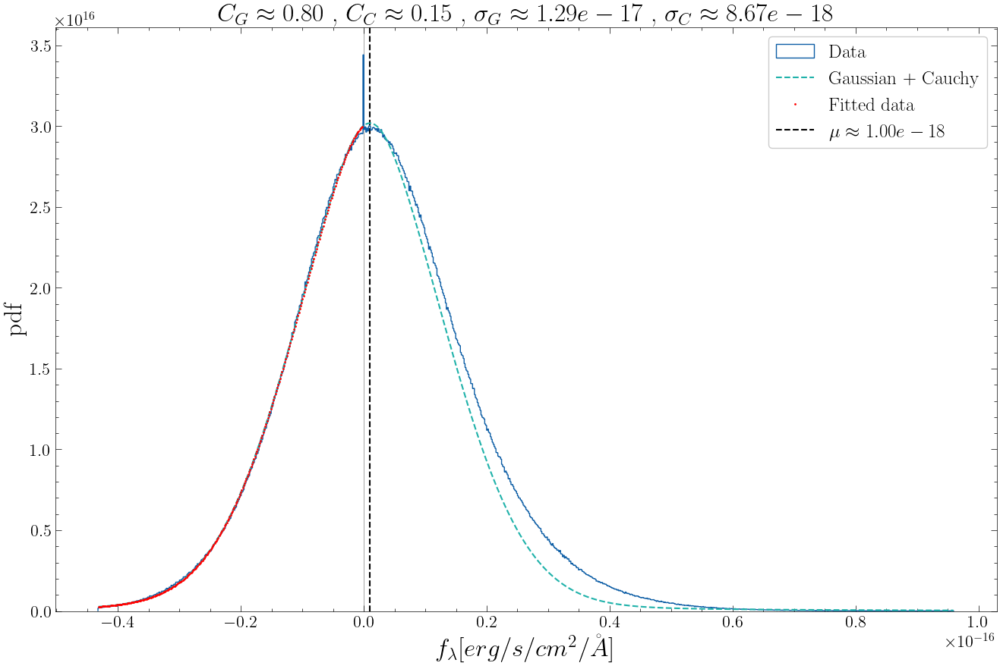

In [14]:
def Gauss_Plus_Cauchy(x, mu, C_gauss, scale_gauss, C_cauchy, scale_cauchy):
    return (C_gauss*stats.norm.pdf(x, loc=mu, scale=scale_gauss) + C_cauchy*stats.cauchy.pdf(x, loc=mu, scale=scale_cauchy))

# Create an histogram, with a number of bins given by the Friedmann-Diaconis rule (https://en.wikipedia.org/wiki/Freedman%E2%80%93Diaconis_rule), and fit it with a Gaussian.
bins = np.histogram_bin_edges(final_Ha_physical.flatten(), bins='fd', range=[np.quantile(final_Ha_physical, [0.001])[0], np.quantile(final_Ha_physical, [0.999])[0]])
x_hist = bins[:-1] + np.diff(bins)/2

# We have to rescale the data, overwise the fit would fail.
y_fit, bins_fit = np.histogram(1e17*final_Ha_physical, density=True, bins=1e17*bins)
x_fit = bins_fit[:-1] + np.diff(bins_fit)/2

half_index = int(np.median(np.where(np.isclose(x_fit, 0, atol=1e-1))[0]))
fit_result = curve_fit(Gauss_Plus_Cauchy, x_fit[:half_index], y_fit[:half_index], [0, 0.5, 1, 0.5, 1], sigma=np.sqrt(y_fit[:half_index]), bounds=([-0.1, 0, 0, 0, 0], [0.1, 1, 5, 1, 5]))
mu = 1e-17*fit_result[0][0]
C_gauss = fit_result[0][1]
scale_gauss = 1e-17*fit_result[0][2]
C_cauchy = fit_result[0][3]
scale_cauchy = 1e-17*fit_result[0][4]


# Plot the results
plt.figure(figsize=(16, 10))
plt.title(f'$C_G \\approx {C_gauss:.2f}$ , $C_C \\approx {C_cauchy:.2f}$ , $\sigma_G \\approx {scale_gauss:.2e}$ , $\sigma_C \\approx {scale_cauchy:.2e}$')
plt.hist(final_Ha_physical.flatten(), bins=bins, histtype='step', density=True, label='Data');
plt.plot(x_hist, Gauss_Plus_Cauchy(x_hist, mu, C_gauss, scale_gauss, C_cauchy, scale_cauchy), linestyle='--', c='lightseagreen', label='Gaussian + Cauchy')
plt.plot(x_hist[:half_index], Gauss_Plus_Cauchy(x_hist[:half_index], mu, C_gauss, scale_gauss, C_cauchy, scale_cauchy), marker='.', markersize=2, markeredgecolor='red', markerfacecolor='red', linewidth=0, label='Fitted data')
plt.axvline(mu, c='k', lw=1.5, linestyle='--', label=f'$\mu \\approx {mu:.2e}$', zorder=0)
plt.axvline(0, c='gray', lw=0.5, zorder=0)
plt.xlabel('$f_\lambda [erg/s/cm^2/\AA]$')
plt.ylabel('pdf')
plt.legend();

## Hb

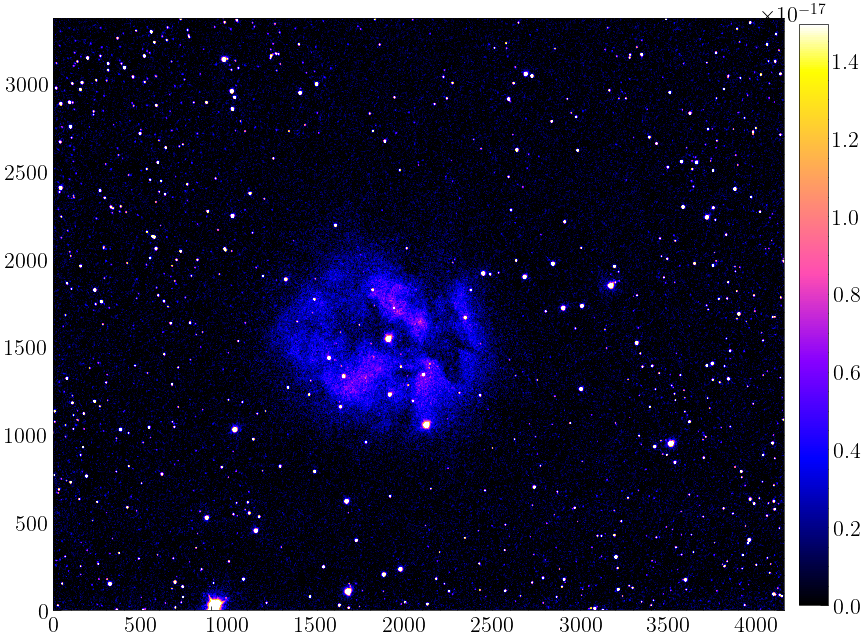

In [15]:
final_Hb_physical = Open_Fits(filepath='Data/final_Hb_physical.fits', plot=True)

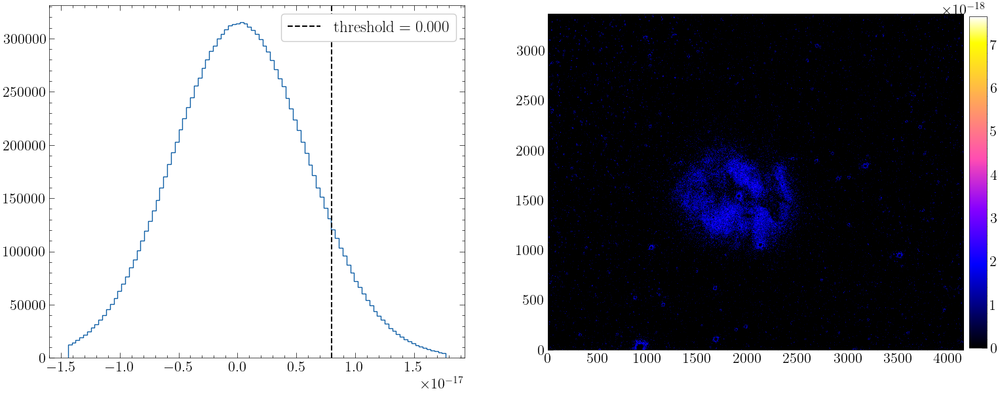

In [16]:
threshold = 0.8e-17
fig, axes = Select_Threshold(final_Hb_physical, threshold)

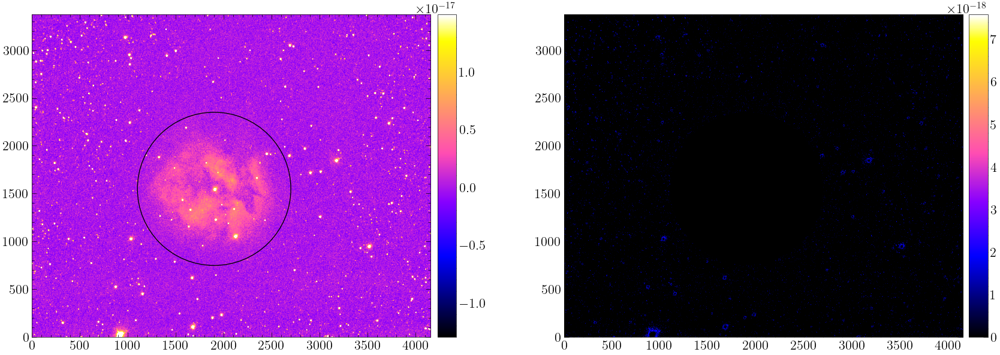

In [17]:
mask_circ = Create_Circular_Mask(final_Hb_physical, center=(1900, 1550), radius=800, mask=final_Hb_physical>threshold)

In [18]:
mask_tot = np.logical_or(final_Hb_physical > threshold, mask_circ)
final_Hb_physical_std = np.std(final_Hb_physical[~mask_tot])
final_Hb_physical_std

4.90416170704592e-18

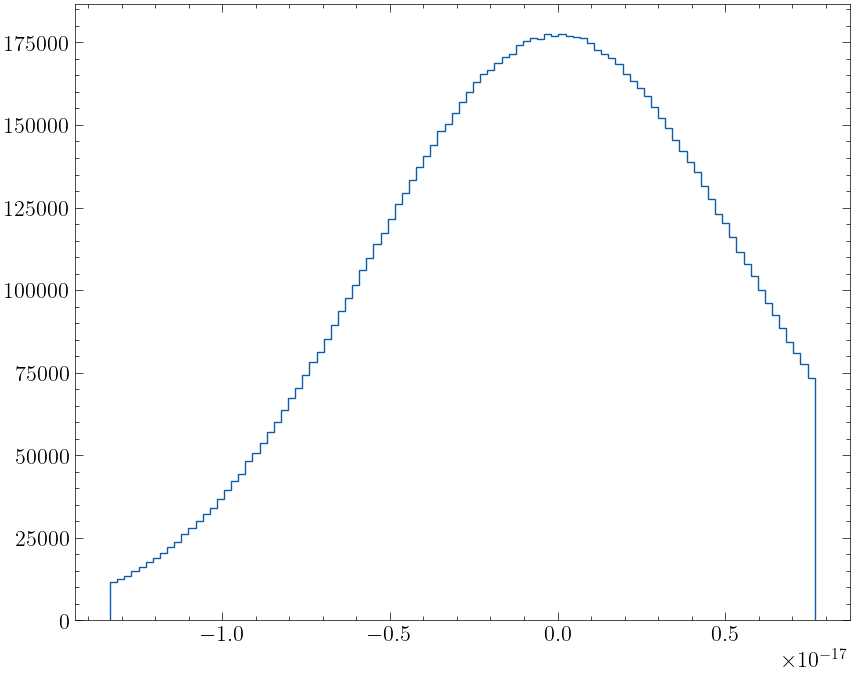

In [19]:
plt.hist(final_Hb_physical[~mask_tot].flatten(), bins=np.linspace(np.quantile(final_Hb_physical[~mask_tot], [0.01])[0], np.quantile(final_Hb_physical[~mask_tot], [0.99])[0], 100), histtype='step');

## r

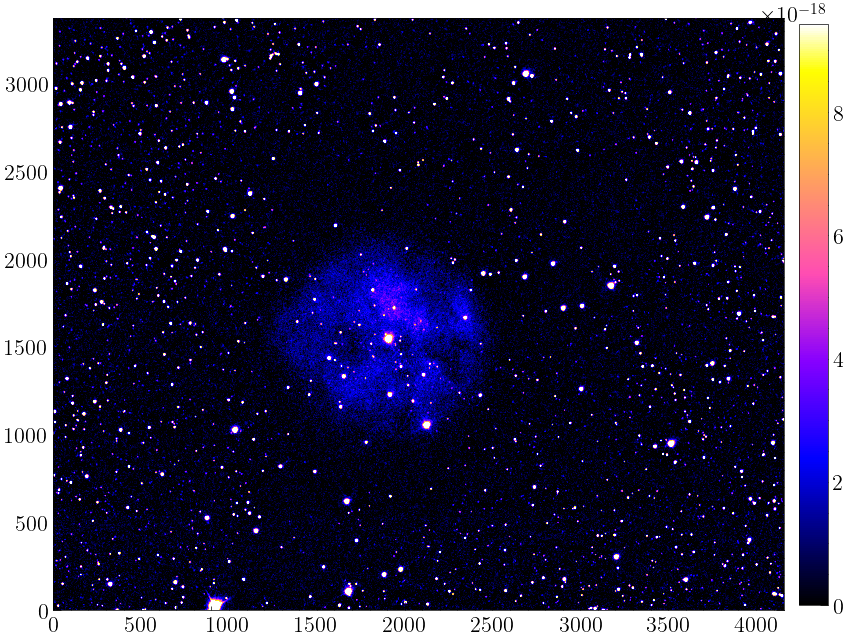

In [20]:
final_r_physical = Open_Fits(filepath='Data/final_r_physical.fits', plot=True)

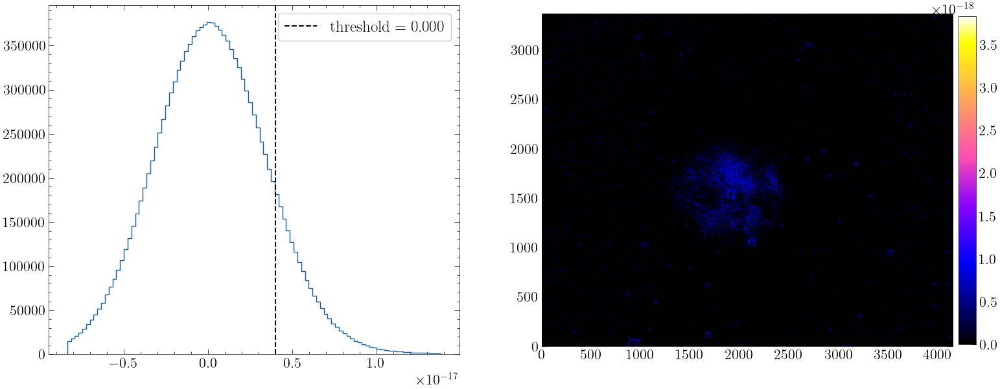

In [21]:
threshold = 0.4e-17
fig, axes = Select_Threshold(final_r_physical, threshold)

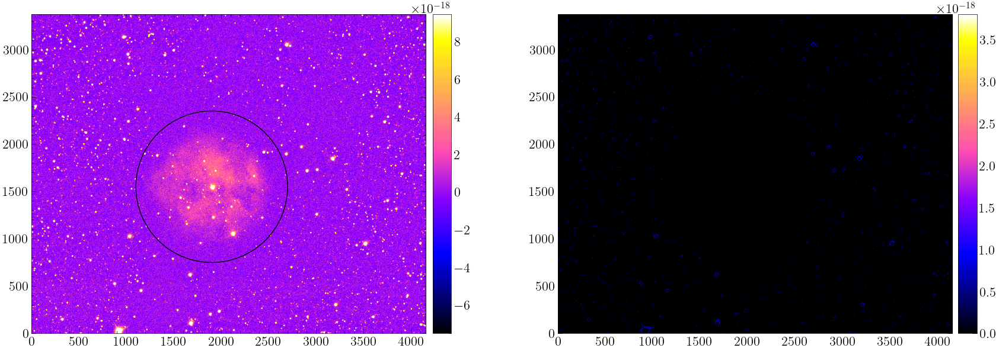

In [22]:
mask_circ = Create_Circular_Mask(final_r_physical, center=(1900, 1550), radius=800, mask=final_r_physical>threshold)

In [23]:
mask_tot = np.logical_or(final_r_physical > threshold, mask_circ)
final_r_physical_std = np.std(final_r_physical[~mask_tot])
final_r_physical_std

2.7250644633089937e-18

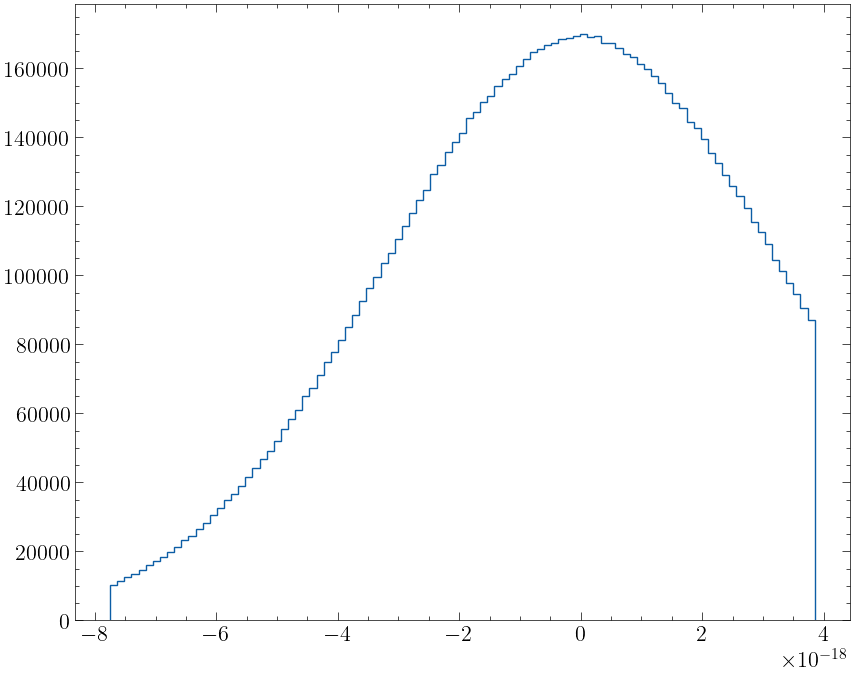

In [24]:
plt.hist(final_r_physical[~mask_tot].flatten(), bins=np.linspace(np.quantile(final_r_physical[~mask_tot], [0.01])[0], np.quantile(final_r_physical[~mask_tot], [0.99])[0], 100), histtype='step');

# Lecture notes

The following extract comes from the lecture notes of the 'Introduction to Galaxies' course of M.Fumagalli and M.Fossati


<div>
<img src="Data/Dust_lecture_notes.png" width="1000"/>
</div>

# Ratio of Ha and Hb

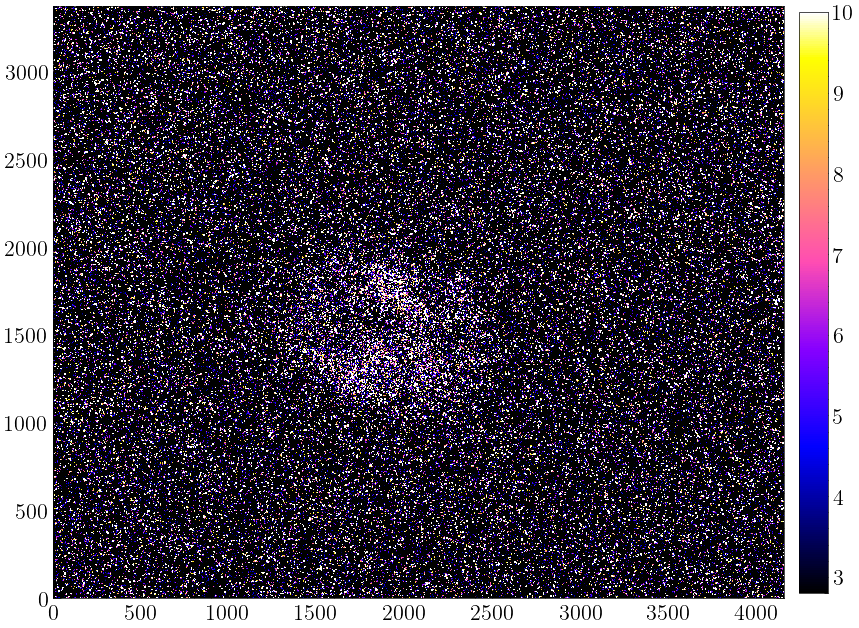

In [25]:
ratio_Ha_Hb = final_Ha_physical / final_Hb_physical

plt.imshow(ratio_Ha_Hb, clim=(2.8,10), cmap='gnuplot2', origin='lower')
plt.colorbar(fraction=0.0375, pad=0.02);

In [26]:
from astropy.convolution import convolve, convolve_fft, Gaussian2DKernel

gauss_kernel = Gaussian2DKernel(2, 2)

ratio_Ha_Hb_smoothed = convolve_fft(final_Ha_physical, gauss_kernel) / convolve_fft(final_Hb_physical, gauss_kernel)

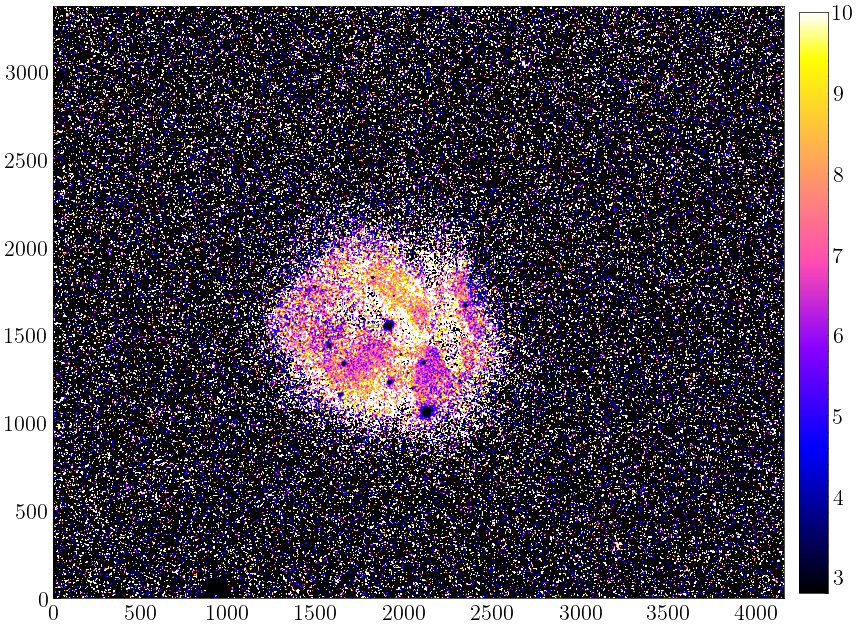

In [27]:
plt.imshow(ratio_Ha_Hb_smoothed, clim=(2.8,10), cmap='gnuplot2', origin='lower')
plt.colorbar(fraction=0.0375, pad=0.02);

## Computing $E(B-V)$

The following extract comes from 'J-PLUS: Measuring Hα emission line fluxes in the nearby universe' by Logroño-García et al (https://doi.org/10.1051/0004-6361/201732487).

<div>
<img src="Data/Dust_HaHbRatio.png" width="600"/>
</div>

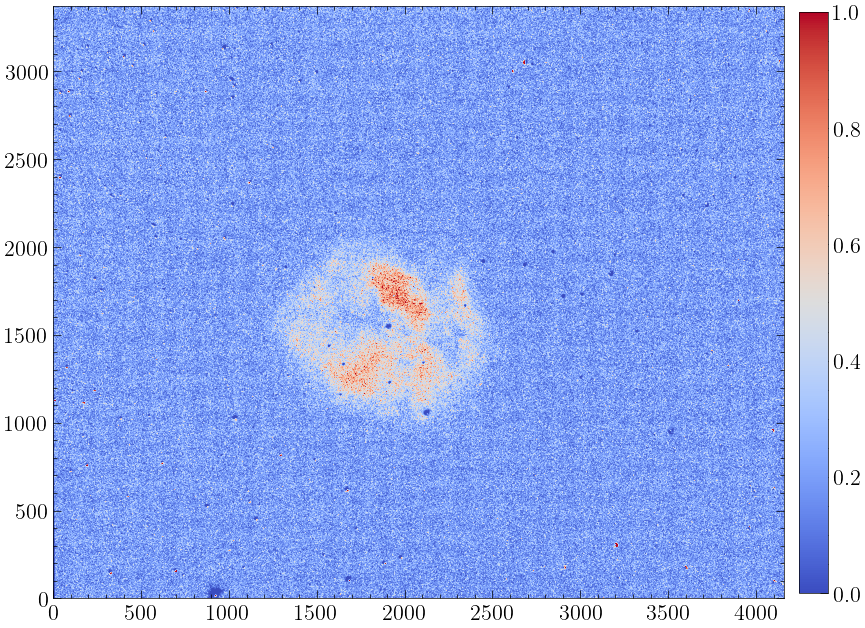

In [28]:
def EBV(image):
    image [image < 2.86] = 2.86
    return 1.97*np.log10(image/2.86)

EBV_Ha_Hb = EBV(ratio_Ha_Hb)

plt.imshow(EBV_Ha_Hb, clim=(0, 1), cmap='coolwarm', origin='lower')
plt.colorbar(fraction=0.0375, pad=0.02);

In [29]:
np.sum(EBV_Ha_Hb>5)/np.sum(EBV_Ha_Hb>-1000)

0.0008166303418528938

## Estimating the emitted flux

The observed flux, equal to the emitted flux minus the filtered flux, is given by the formula (Calzetti, 2000):

$$f_{obs}(\lambda) = f_{emit}(\lambda) \times 10^{-0.4 \times k(\lambda) \times E(B-V)}$$

$$k(\lambda) = 
\begin{cases}
      2.659 \times (-2.156+\frac{1.509}{\lambda}-\frac{10.198}{\lambda^2}+\frac{0.011}{\lambda^3}) + 4.05 \:\:\:\:\: & for \:\: 0.12\mu m \leq \lambda \leq 0.63\mu m \\
      2.659 \times (-1.857+\frac{1.040}{\lambda}) + 4.05 & for \:\: 0.63\mu m < \lambda \leq 2.20\mu m
\end{cases}$$

The term $E(B-V) \in [0,1]$ describes the amount of dust. In particular, $E(B-V)=0$ corresponds to zero dust attenuation, while $E(B-V)=1$ means maximum dust attenuation.

k_{Calzetti} = 3.31


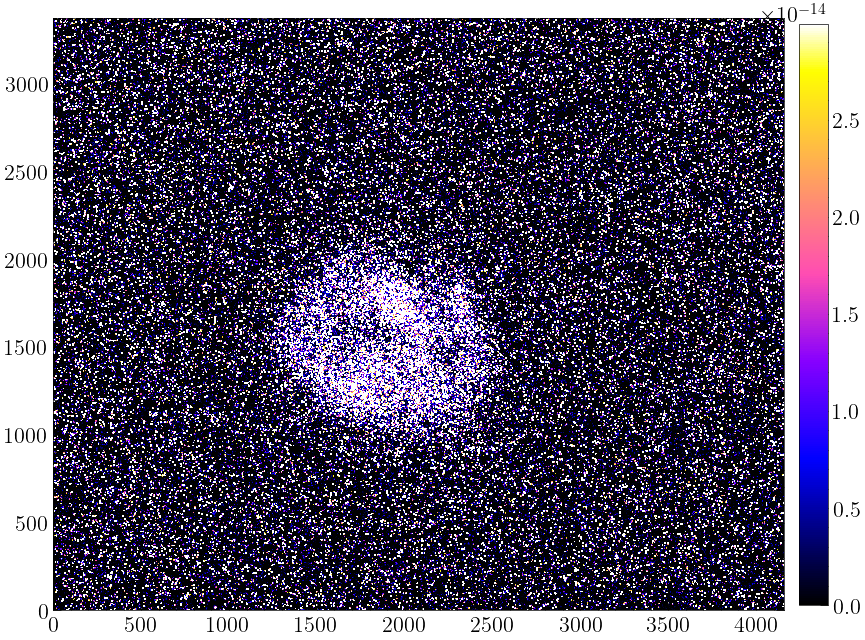

In [30]:
def dust_att_k(wav):
    wav_um = wav/(10**4)
    k1 = 2.659*(-2.156 + 1.509/wav_um - 0.198/(wav_um**2) + 0.011/(wav_um**3)) + 4.05
    k2 = 2.659*(-1.857 + 1.040/wav_um) + 4.03 
    k = np.where(wav_um<=0.63, k1, k2)
    return k

def Emitted_Flux(image, wav, EBV):
    k = dust_att_k(wav)
    print(f'k_{{Calzetti}} = {k:.2f}')
    return image*10**(0.4*k*EBV)

Emitted_Ha = Emitted_Flux(final_Ha_physical, 6563, EBV_Ha_Hb)
plt.imshow(Emitted_Ha, clim=(0, np.quantile(Emitted_Ha, [0.99])), cmap='gnuplot2', origin='lower')
plt.colorbar(fraction=0.0375, pad=0.02);

k_{Calzetti} = 4.60


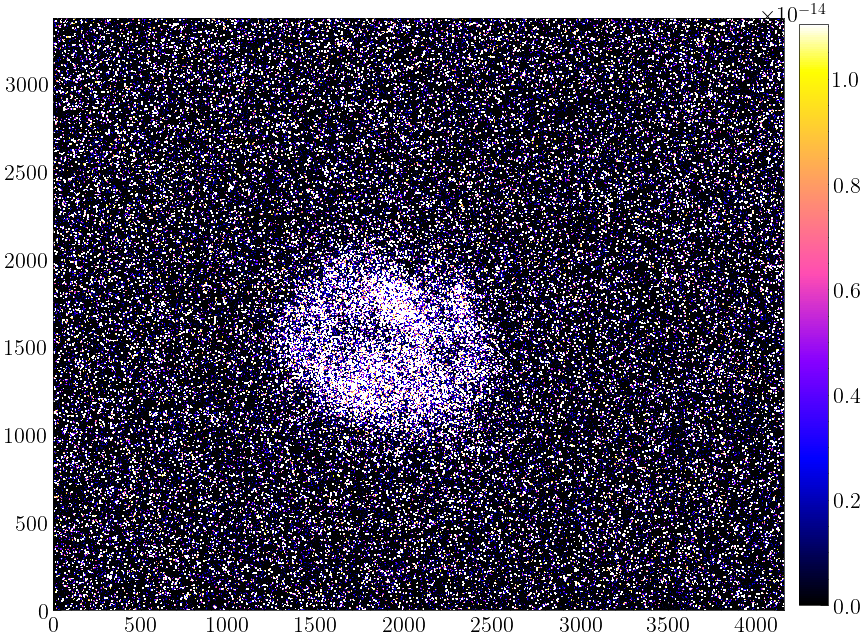

In [31]:
Emitted_Hb = Emitted_Flux(final_Hb_physical, 4861, EBV_Ha_Hb)
plt.imshow(Emitted_Hb, clim=(0, np.quantile(Emitted_Hb, [0.99])), cmap='gnuplot2', origin='lower')
plt.colorbar(fraction=0.0375, pad=0.02);

# Masking the stars

In [32]:
final_Ha_radec = fits.open('Data/final_Ha_radec.fits')[1].data

In [33]:
# https://vizier.cds.unistra.fr/viz-bin/VizieR-3?-source=I/355/gaiadr3
# Constraints: 328.25 < RA < 328.5     47.2 < DEC < 47.35     Gmag < 18
GAIA_catalogue = fits.open('Data/GAIA_catalogue_whithin_nebula.fit')[1].data

We are going to perform aperture photometry on 29 stars


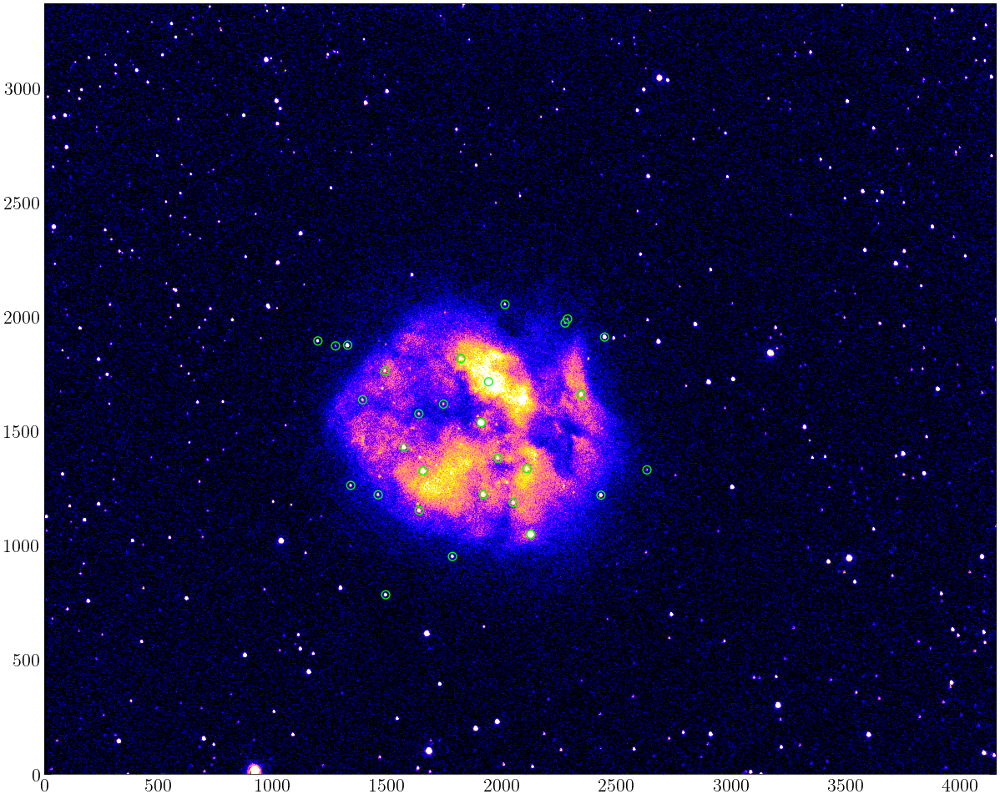

In [34]:
stars_x = []
stars_y = []
stars_Gaianame = []
stars_Gmag = []

for i in range(len(GAIA_catalogue['RA_ICRS'])):
    # Consider only the stars that are bright enough
    if GAIA_catalogue['Gmag'][i] < 15:
        # Find the matches between GAIA stars and our stars
        # If there is only one match, append the coordinates (from astrometry.net) and magnitudes (from GAIA catalogue)
        # If there is no match or more than one match, do nothing
        mask_ra = np.isclose(final_Ha_radec['ra'], GAIA_catalogue['RA_ICRS'][i], atol=0, rtol=0.000002)
        mask_dec = np.isclose(final_Ha_radec['dec'], GAIA_catalogue['DE_ICRS'][i], atol=0, rtol=0.000002)
        mask_tot = np.logical_and(mask_ra, mask_dec)
        if np.sum(mask_tot) == 1:
            stars_x.append(final_Ha_radec['x'][mask_tot][0])
            stars_y.append(final_Ha_radec['y'][mask_tot][0])
            stars_Gaianame.append(GAIA_catalogue['Source'][i])
            stars_Gmag.append(GAIA_catalogue['Gmag'][i])
        
stars_x = np.array(stars_x)
stars_y = np.array(stars_y)
stars_Gaianame = np.array(stars_Gaianame)
stars_Gmag = np.array(stars_Gmag)
        
plt.figure(figsize=(18,12))
plt.imshow(final_Ha_physical, clim=(0, np.quantile(final_Ha_physical, [0.99])), cmap='gnuplot2', origin='lower')

for i in range(len(stars_x)):
    plt.scatter(stars_x[i], stars_y[i], facecolors='none', edgecolors='lime', s=50)
    
print(f'We are going to perform aperture photometry on {len(stars_Gaianame)} stars')

In [35]:
def Mask_Stars(image, stars_x, stars_y, stars_Gaianame, stars_Gmag, plot=False, rectangle_side=20, fwhm_factor=3):
    
    N = len(stars_x)
    
    Y, X = np.ogrid[:image.shape[0], :image.shape[1]]
    mask_stars = image==image
    
    fig, ax = plt.subplots(figsize=(18,12))
    ax.imshow(image, clim=(0, np.quantile(image, [0.99])), cmap='gnuplot2', origin='lower')
    
    if plot==True:
        if N % 8 == 0:
            fig_2, axes_2 = plt.subplots(int(N/8), 8, figsize=(24, 4*int(N/8)))
        else:
            fig_2, axes_2 = plt.subplots(int(N/8)+1, 8, figsize=(24, 4*(int(N/8)+1)))


    for i in range(N):
        rectangle_side_i = rectangle_side*(14/stars_Gmag[i])
        cutout = image[round(stars_y[i]-rectangle_side_i/2):round(stars_y[i]+rectangle_side_i/2), round(stars_x[i]-rectangle_side_i/2):round(stars_x[i]+rectangle_side_i/2)]

        # 1) Compute the FWHM of the stars to decide the radius of the circular aperture   
        y, x = np.mgrid[:cutout.shape[0], :cutout.shape[1]]
        gaussian_init = models.Gaussian2D(amplitude=np.max(cutout), 
                                          x_mean=cutout.shape[0]/2, 
                                          y_mean=cutout.shape[1]/2, 
                                          x_stddev=cutout.shape[0]/5, 
                                          y_stddev=cutout.shape[1]/5)
        gaussian_fit = fitting.LevMarLSQFitter()
        fitted_gaussian = gaussian_fit(gaussian_init, x, y, cutout)
        mean_x = fitted_gaussian.x_mean.value
        fwhm_x = 2.355*fitted_gaussian.x_stddev.value
        mean_y = fitted_gaussian.y_mean.value
        fwhm_y = 2.355*fitted_gaussian.y_stddev.value
        
            
        # 2) Redefine the centroid and define the aperture radius
        # the cutout frame, in which mean_x and mean_y are defined, is centered on the left-bottom corner of the rectangle
        aperture_centroid = [round(stars_x[i]-rectangle_side_i/2)+mean_x, round(stars_y[i]-rectangle_side_i/2)+mean_y]
        # the aperture radius is a radius, and thus we must divide the FWHM by 2!
        aperture_r = fwhm_factor*np.mean([fwhm_x/2, fwhm_y/2])
        
        
        # 3) Define the circular masks
        dist_from_center = np.sqrt((X - aperture_centroid[0])**2 + (Y-aperture_centroid[1])**2)
        mask_star = dist_from_center <= aperture_r
        mask_stars = np.logical_and(mask_stars, ~mask_star)

        
        # 4) Plot the resulting apertures on the image
        circle_plot = plt.Circle(aperture_centroid, aperture_r, color='lime', linewidth=0.8, fill=False)
        ax.add_patch(circle_plot)
        ax.text(aperture_centroid[0]+1.5*aperture_r, aperture_centroid[1]-0.8*aperture_r, f'{i}', fontsize=15, color='lime')
        
        
        # 5) Plot the cutouts
        if plot==True:
            ax_2 = axes_2.flatten()[i]
            ax_2.set_title(f'Star {i}: {stars_Gaianame[i]} \n ', fontsize=11)
            ax_2.imshow(cutout, clim=(0, np.quantile(cutout, [0.99])), cmap='gnuplot2', origin='lower')
            circle_plot = plt.Circle([mean_x, mean_y], aperture_r, color='lime', linewidth=1.5, fill=False)
            ax_2.add_patch(circle_plot)
        
            # Remove the unused axes (actually, it does not work)
            for i in range(N % 8):
                axes_2.flatten()[-1-i].axis('off')
    
    return mask_stars

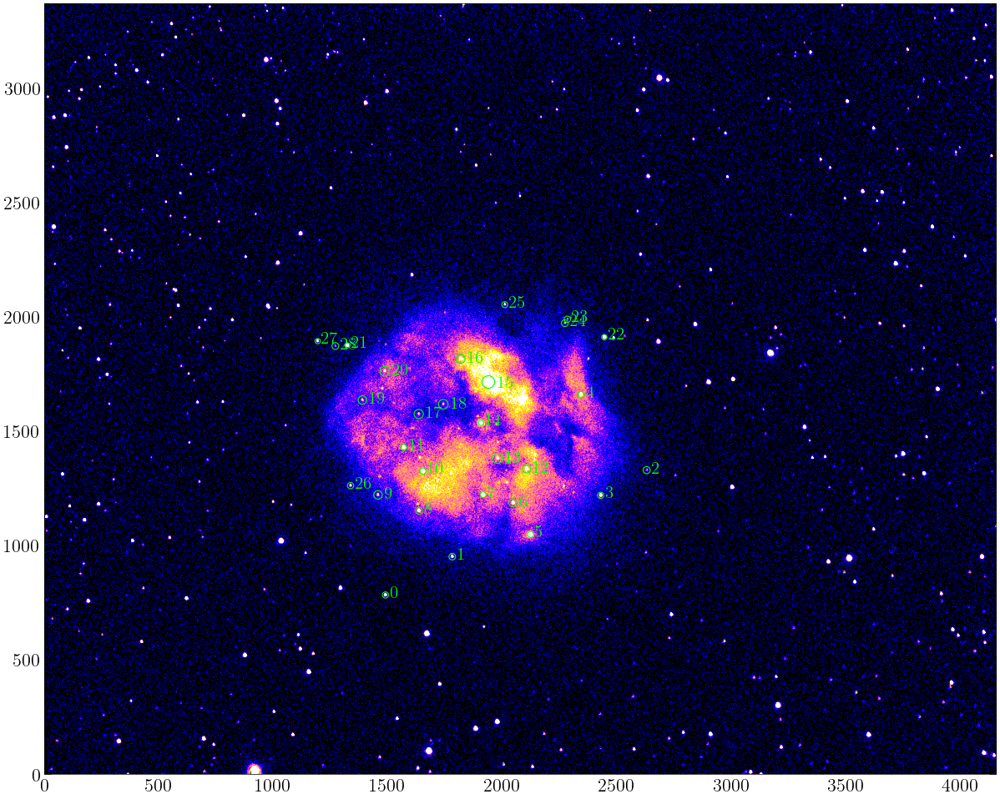

In [36]:
mask_stars = Mask_Stars(final_Ha_physical, stars_x, stars_y, stars_Gaianame, stars_Gmag, plot=False)

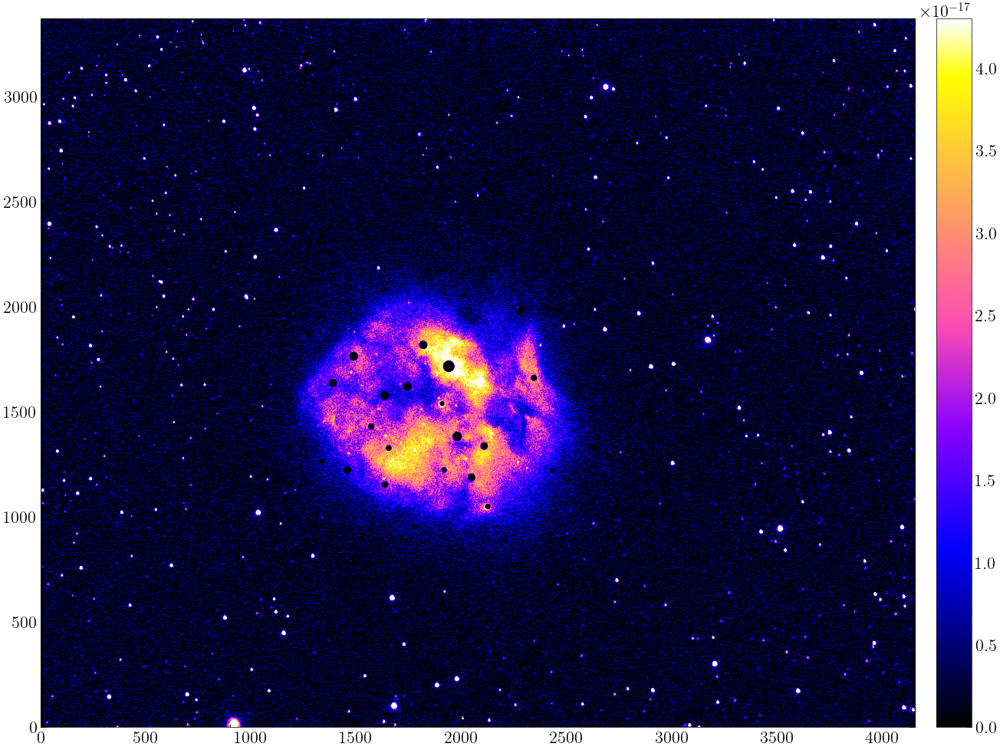

In [37]:
final_Ha_physical_masked = final_Ha_physical.copy()
final_Ha_physical_masked[~mask_stars] = 1e-20

plt.figure(figsize=(18,12))
plt.imshow(final_Ha_physical_masked, clim=(0, np.quantile(final_Ha_physical_masked, [0.99])), cmap='gnuplot2', origin='lower')
plt.colorbar(fraction=0.0375, pad=0.02);